In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from wordcloud import WordCloud
from collections import Counter

In [3]:
# import data
data = pd.read_csv("../data/result_1.csv")
data

,title,stars,text,pelayanan,fasilitas,predicted_labels,labels
0,RS Brayat Minulya,5,telah dirawat di sini selama beberapa hari di ...,1,1,"['pelayanan', 'fasilitas']",positive
1,RS Brayat Minulya,5,bersih dan rapi petugas peeawatdokter ditanya ...,1,1,"['pelayanan', 'fasilitas']",positive
2,RS Brayat Minulya,5,terimakasih atas pelayanan dan perawatan ibu s...,1,0,['pelayanan'],positive
3,RS Brayat Minulya,5,pelayanan diruang yosef bagus perawat ramah ra...,1,0,['pelayanan'],positive
4,RS Brayat Minulya,5,tempatnya bagusrapi nyaman sekali ruangan nya ...,1,1,"['pelayanan', 'fasilitas']",positive
...,...,...,...,...,...,...,...
7634,Rumah Sakit Umum Pusat Surakarta,4,lama banget pelayanan untuk pasien baru ibu ny...,1,0,['pelayanan'],negative
7635,Rumah Sakit Umum Pusat Surakarta,4,hospital yg sangat rapi pelayanan bagus,1,1,"['pelayanan', 'fasilitas']",positive
7636,Rumah Sakit Umum Pusat Surakarta,4,khusus paru,0,0,[],positive
7637,Rumah Sakit Umum Pusat Surakarta,5,rs paru,0,0,[],neutral


In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7639 entries, 0 to 7638
Data columns (total 7 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   title             7639 non-null   object
 1   stars             7639 non-null   int64 
 2   text              7639 non-null   object
 3   pelayanan         7639 non-null   int64 
 4   fasilitas         7639 non-null   int64 
 5   predicted_labels  7639 non-null   object
 6   labels            7639 non-null   object
dtypes: int64(3), object(4)
memory usage: 417.9+ KB


In [6]:
# rubah nama labels menjadi sentiment
data.rename(columns={'labels': 'sentiment'}, inplace=True)

In [7]:
import re

# daftar kata
stopwords = ['saya', 'yg', 'dan', 'yang', 'di', 'tidak', 'juga', 'utk', 'itu',
             'untuk', 'juga', 'jg', 'nya', 'tapi', 'tp', 'ga', 'gak', 'ngga', 'nggak', 'sy', 'lagi',
             'lg', 'dengan', 'dgn', 'dg', 'ini', 'kami', 'apa', 'ada', 'ke', 'ya', 'dong', 'sgt', 'bgt',
             'karena', 'krn', 'sebagai', 'sbg', 'dari', 'malah']

def remove_stopwords(text):
    if isinstance(text, str):
        pattern = r'\b(?:' + '|'.join(stopwords) + r')\b'
        return re.sub(pattern, '', text, flags=re.IGNORECASE).strip()
    return text

In [8]:
# apply function
data['text'] = data['text'].apply(remove_stopwords)

# Wordcloud tiap sentimen di setiap rumah sakit

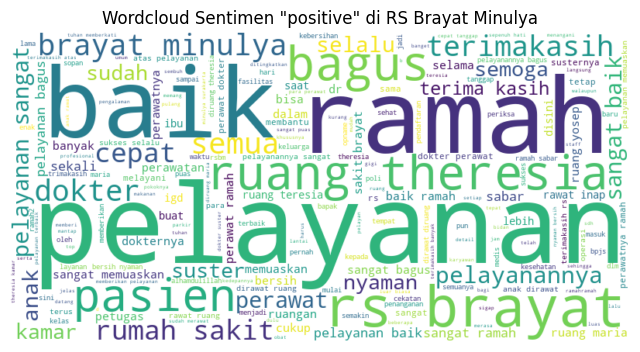

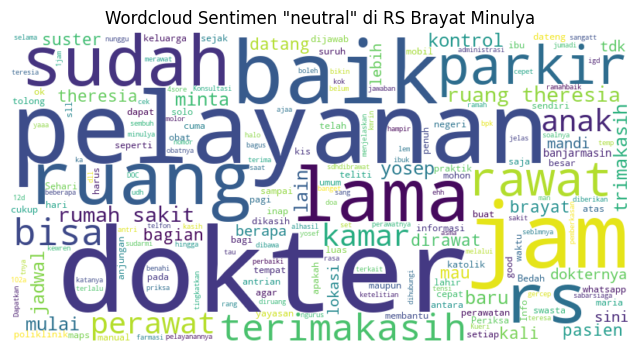

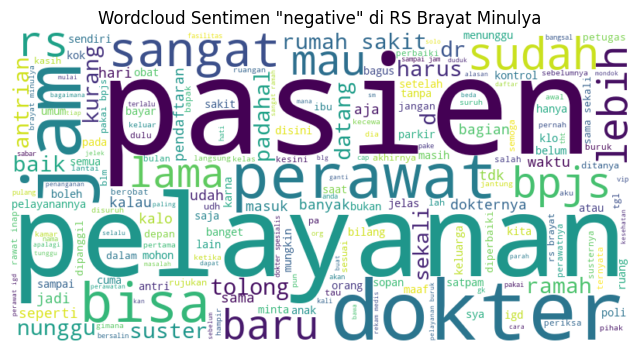

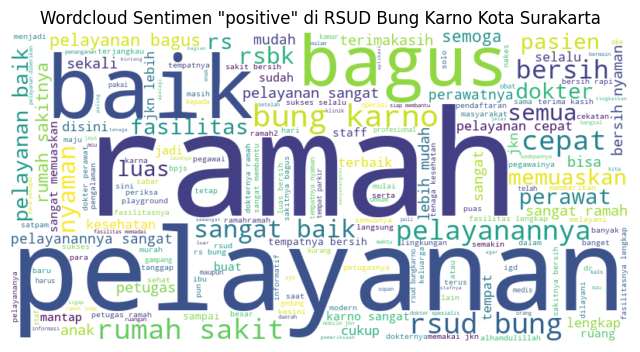

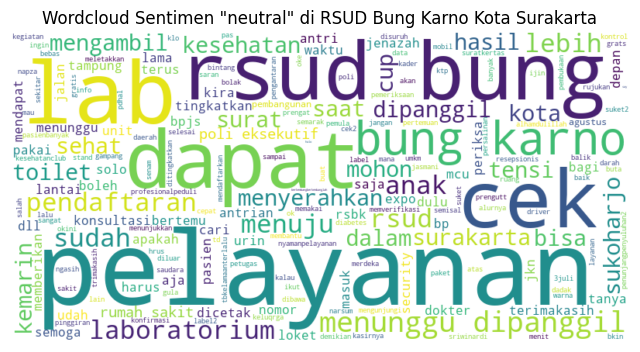

...

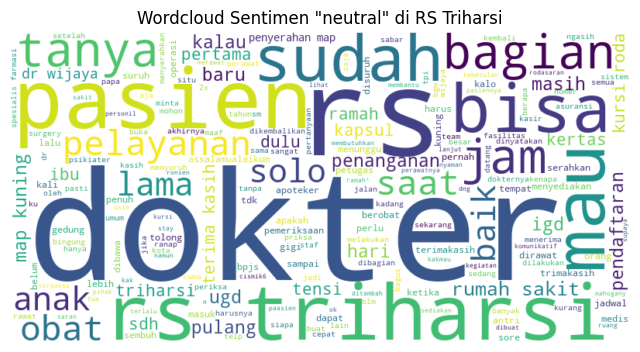

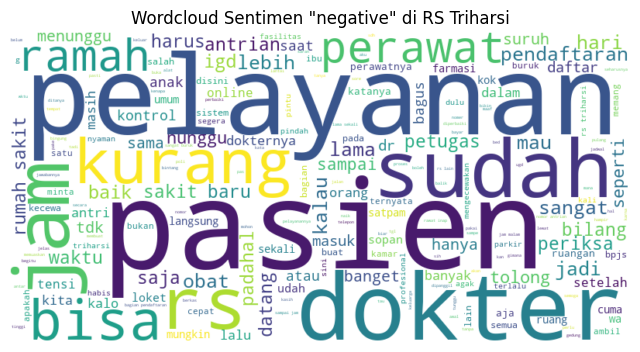

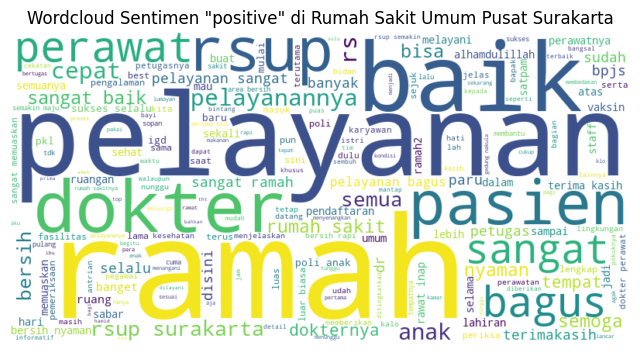

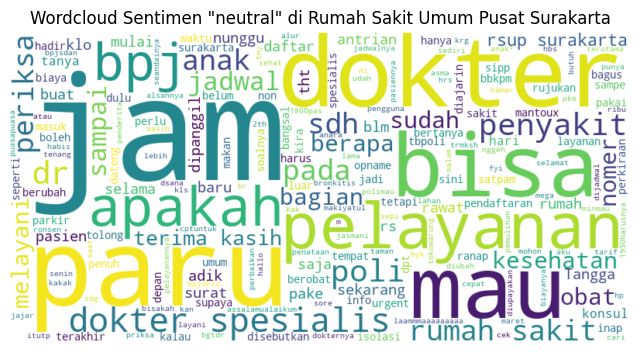

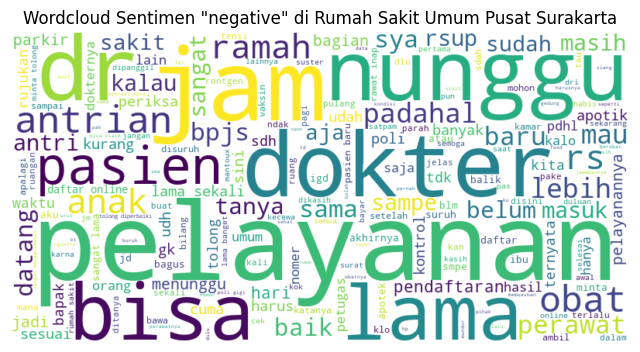

In [9]:
# Membuat wordcloud untuk tiap sentimen di setiap rumah sakit
sentiments = data['sentiment'].unique()
rumah_sakit = data['title'].unique()

for rs in rumah_sakit:
    for sent in sentiments:
        subset = data[(data['title'] == rs) & (data['sentiment'] == sent)]
        text = ' '.join(subset['text'].dropna().astype(str))
        if text.strip():  # hanya jika ada teks
            wc = WordCloud(width=800, height=400, background_color='white').generate(text)
            plt.figure(figsize=(8, 5))
            plt.imshow(wc, interpolation='bilinear')
            plt.axis('off')
            plt.title(f'Wordcloud Sentimen "{sent}" di {rs}')
            plt.show()

# Wordcloud tiap kategori di setiap rumah sakit

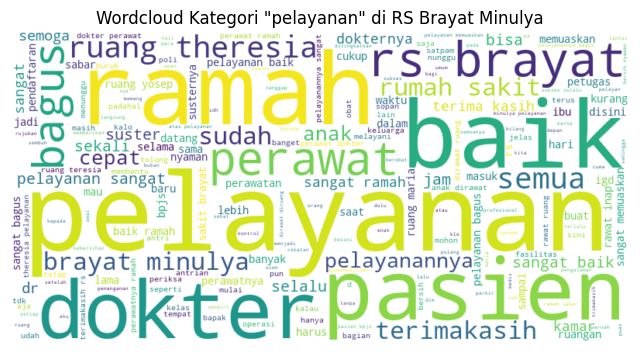

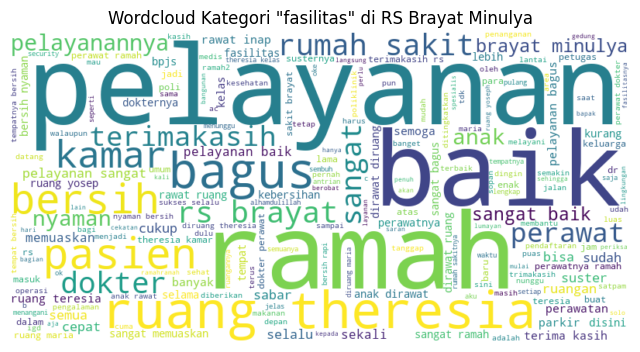

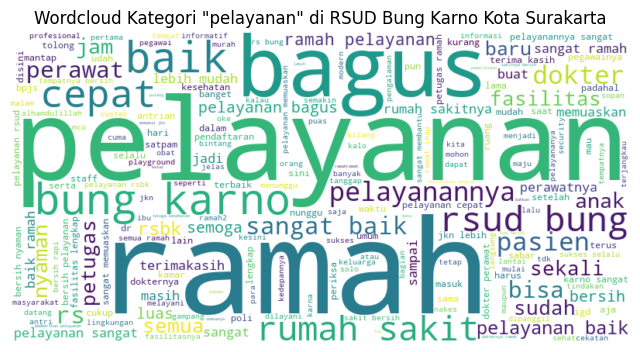

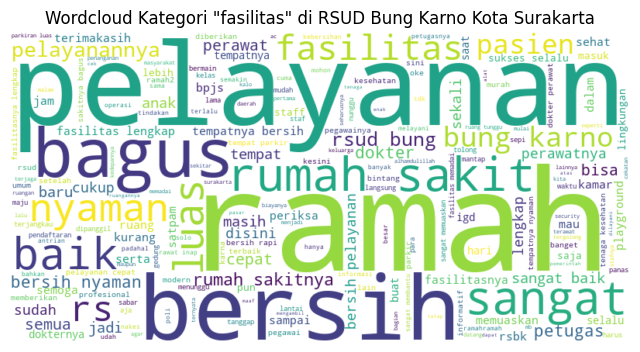

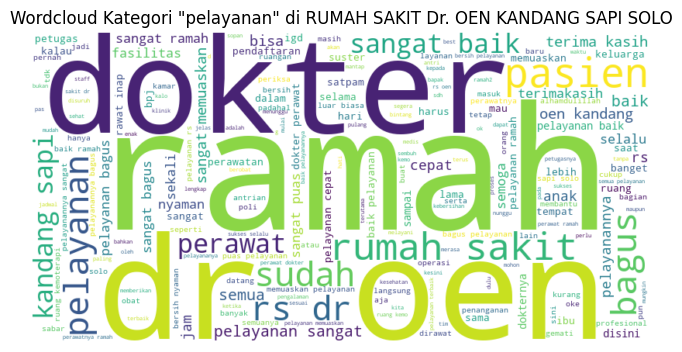

...

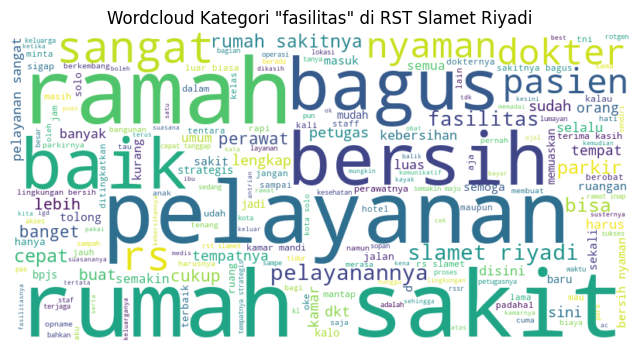

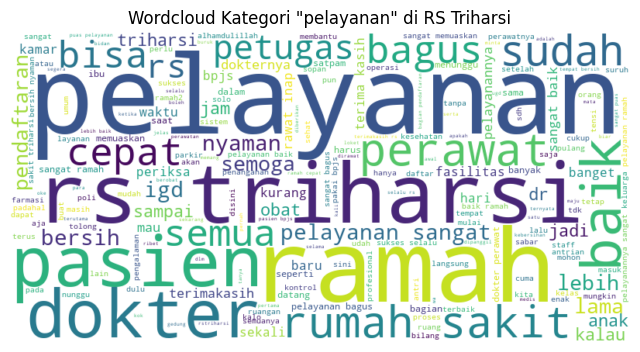

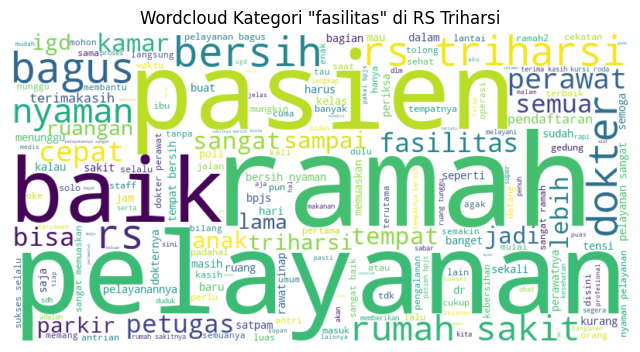

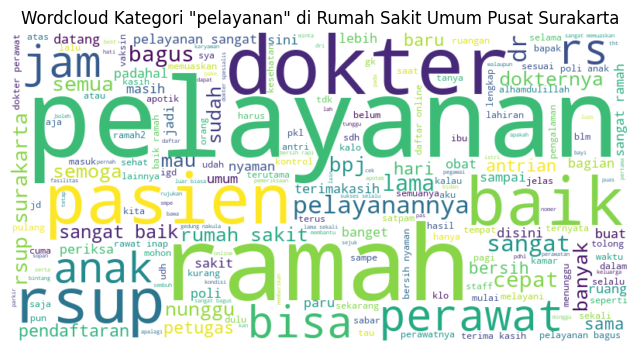

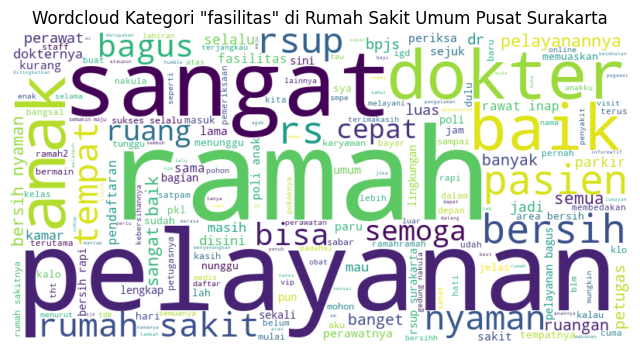

In [10]:
# Membuat wordcloud untuk tiap kategori di setiap rumah sakit
categories = ['pelayanan', 'fasilitas']

for rs in rumah_sakit:
    for cat in categories:
        subset = data[(data['title'] == rs) & (data[cat] == 1)]
        text = ' '.join(subset['text'].dropna().astype(str))
        if text.strip():
            wc = WordCloud(width=800, height=400, background_color='white').generate(text)
            plt.figure(figsize=(8, 5))
            plt.imshow(wc, interpolation='bilinear')
            plt.axis('off')
            plt.title(f'Wordcloud Kategori "{cat}" di {rs}')
            plt.show()

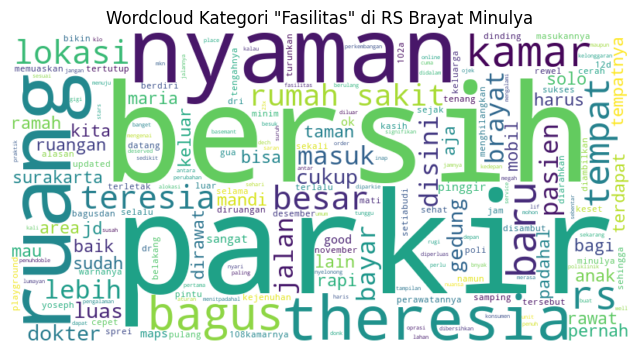

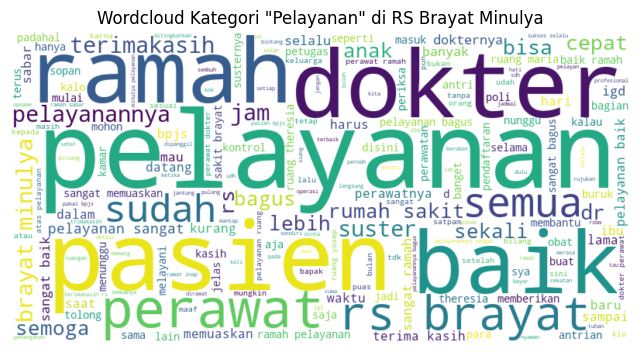

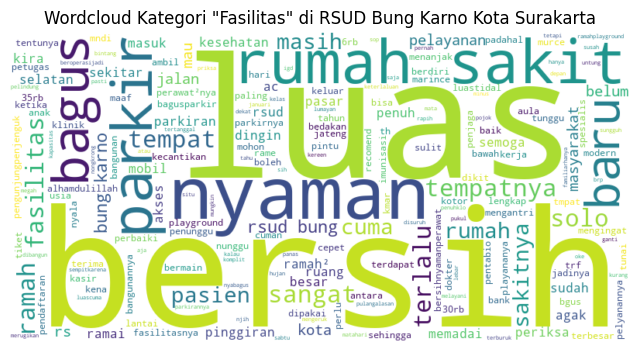

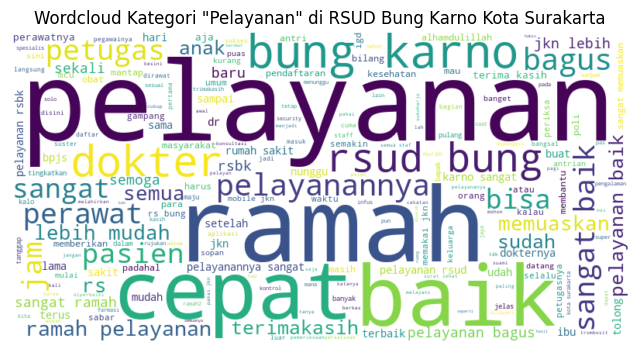

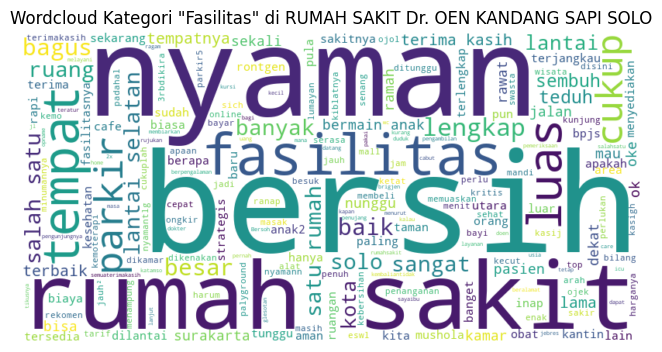

...

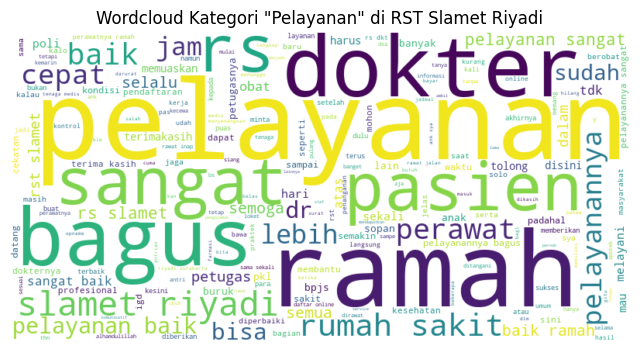

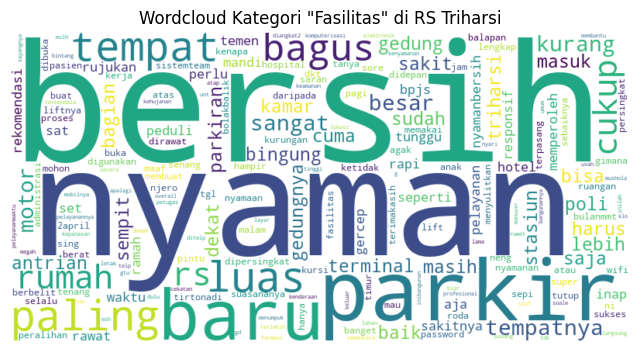

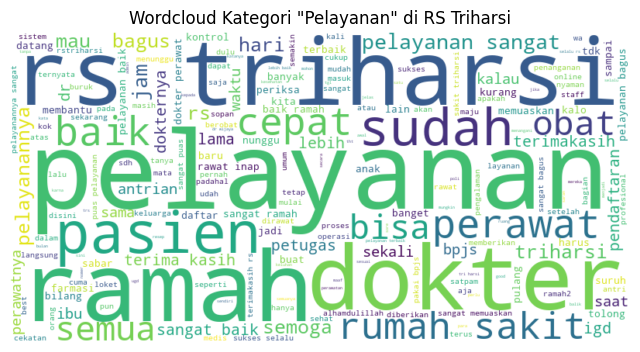

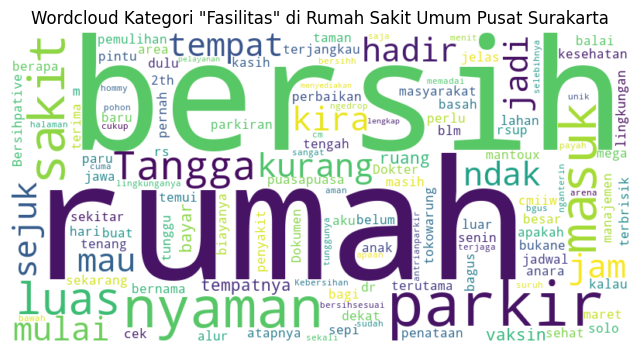

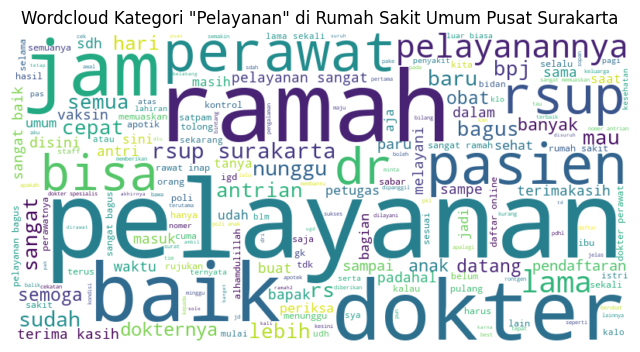

In [11]:
# Wordcloud untuk kategori 'fasilitas saja' dan 'pelayanan saja' di setiap rumah sakit
for rs in rumah_sakit:
    # Fasilitas saja: fasilitas==1 & pelayanan==0
    subset_fasilitas = data[(data['title'] == rs) & (data['fasilitas'] == 1) & (data['pelayanan'] == 0)]
    text_fasilitas = ' '.join(subset_fasilitas['text'].dropna().astype(str))
    if text_fasilitas.strip():
        wc_fasilitas = WordCloud(width=800, height=400, background_color='white').generate(text_fasilitas)
        plt.figure(figsize=(8, 5))
        plt.imshow(wc_fasilitas, interpolation='bilinear')
        plt.axis('off')
        plt.title(f'Wordcloud Kategori "Fasilitas" di {rs}')
        plt.show()
    
    # Pelayanan saja: pelayanan==1 & fasilitas==0
    subset_pelayanan = data[(data['title'] == rs) & (data['pelayanan'] == 1) & (data['fasilitas'] == 0)]
    text_pelayanan = ' '.join(subset_pelayanan['text'].dropna().astype(str))
    if text_pelayanan.strip():
        wc_pelayanan = WordCloud(width=800, height=400, background_color='white').generate(text_pelayanan)
        plt.figure(figsize=(8, 5))
        plt.imshow(wc_pelayanan, interpolation='bilinear')
        plt.axis('off')
        plt.title(f'Wordcloud Kategori "Pelayanan" di {rs}')
        plt.show()